# Первый computational notebook

## Упражнение: Вычисление числа pi с помощью метода Монте-Карло

Каждый пронумерованный элемент будет представлять собой новую ячейку. Нажмите `SHIFT
+ENTER`, чтобы запустить ячейку и создать новую ячейку ниже. Выбрав ячейку, нажмите
`ESCAPE` для перехода в командный режим. Используйте клавиши `M` и `Y` для изменения ячеек
на разметку и код.

1. Создайте новый блокнот , назовите его и добавьте заголовок (ячейку в формате
markdown ниже).

# Подсчет PI с помощью метода Монте-Карло

2. Зафиксируйте соответствующие формулы в новой ячейке (ячейке с Markdown):

## Форумулы
- площадь круга: $c = \pi r^2$
- площадь квадрата: $s = (2 r)^2$
- $c/s = (\pi r^2) / (4 r^2) = \pi / 4$
- $\pi = 4 * c/s$

3. Добавьте изображение для пояснения концепции (ячейка markdown):

![Дротики](https://upload.wikimedia.org/wikipedia/commons/b/ba/Monte-Carlo01.gif)

4. Импортируйте два модуля, которые нам понадобятся (ячейка с кодом):

In [1]:

import random
import matplotlib.pyplot as plt 

5. Инициализируйте количество точек (ячейка с кодом):

In [2]:
num_points = 100000

6. Броски дротиков (ячейка с кодом):

In [3]:
points = []
hits = 0
for _ in range(num_points):
    x, y = random.random(), random.random()
    if x*x + y*y < 1.0:
        hits +=1
        points.append((x,y, "green"))
    else:
        points.append((x,y, "red"))

7. Построение графика результатов (ячейка с кодом):

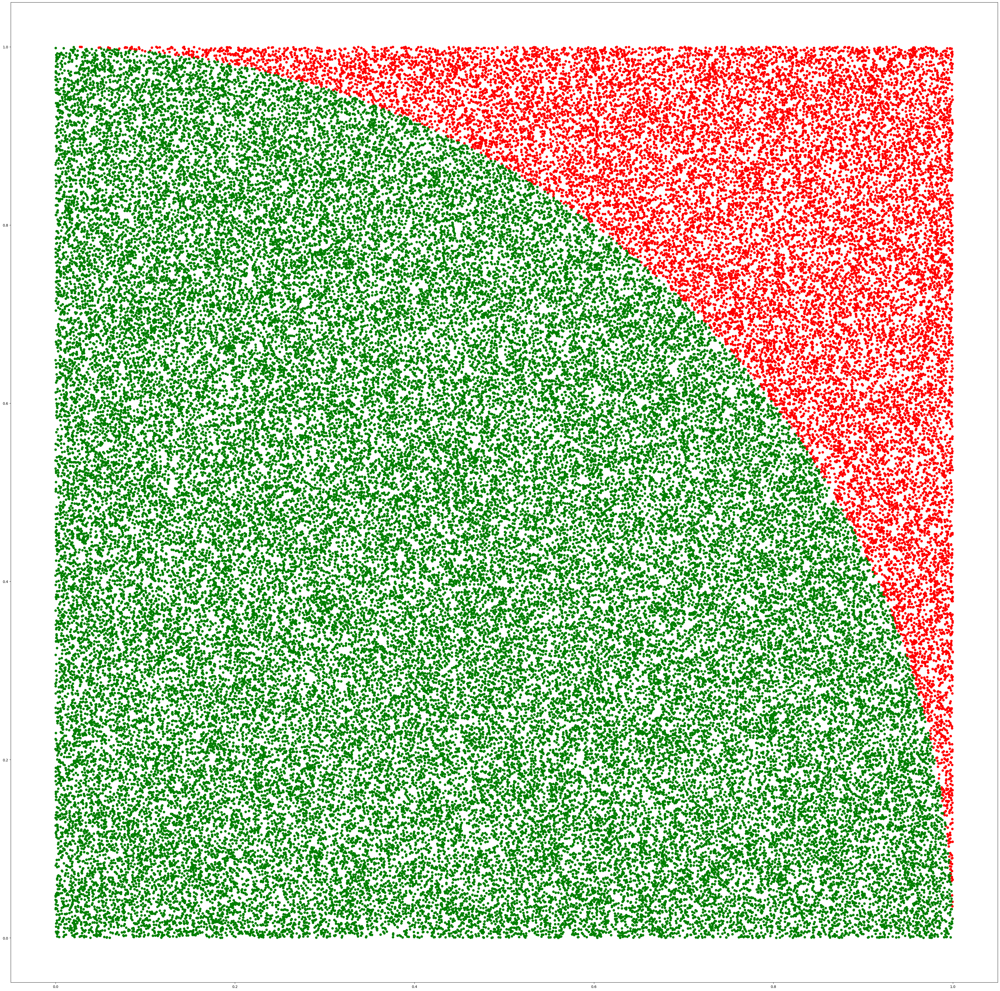

In [4]:
x, y, colors = zip(*points)
fig, ax = plt.subplots()
fig.set_size_inches(50.0,50.0)

ax.scatter(x, y, c=colors)

fraction = hits / num_points

## Полученный результат $\pi$

In [5]:
print("π = ", 4*fraction)

π =  3.14344


# Зависимости

In [6]:

!python -m pip install matplotlib
!python -m pip install pandas matplotlib
!python -m pip install pandas matplotlib seaborn
!python -m pip install ipywidgets
   


Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [7]:
%matplotlib inline
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 
sns.set_theme(style="whitegrid")
from itertools import cycle

## Метод Монте-Карло код через функции

In [8]:
from matplotlib import pyplot 
import random
from ipywidgets import interact, widgets 

In [9]:
%matplotlib inline


def throw_darts(num_points):
    points = []
    hits = 0
    for _ in range(num_points):
        x, y = random.random(), random.random()
        if x*x + y*y < 1.0:
            hits += 1
            points.append((x, y, True))
        else:
            points.append((x, y, False))
    fraction = hits / num_points
    pi = 4 * fraction
    return pi, points


def create_plot(points):
    x, y, colors = zip(*points)
    pyplot.scatter(x, y, c=colors)


def experiment(num_points):
    pi, points = throw_darts(num_points)
    create_plot(points)
    print("approximation:", pi)

### Использование виджетов

interactive(children=(IntSlider(value=1000, description='num_points', max=10000, min=100, step=100), Output())…

<function __main__.experiment(num_points)>

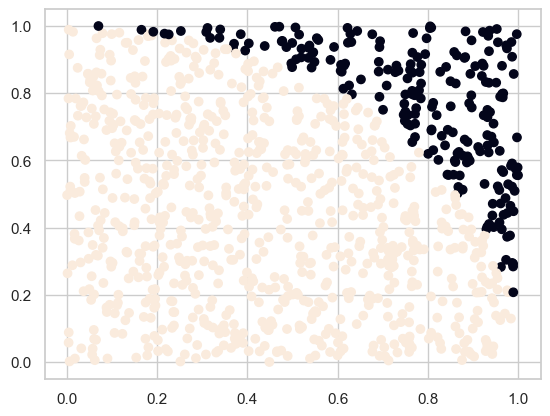

In [10]:
interact(experiment, num_points=widgets.IntSlider(min=100, max=10000, step=100,
value=1000))

### Виджеты для интерактивной подгонки данных (data fitting)

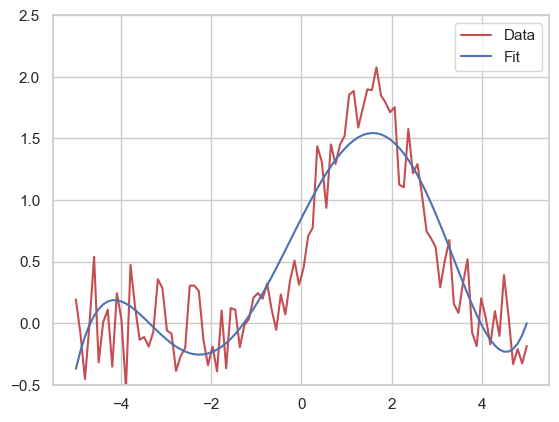

In [11]:
import numpy as np 

import matplotlib.pyplot as plt 
%matplotlib inline


def gaussian(x, a, b, c):
    return a * np.exp(-b * (x-c)**2)


def noisy_gaussian():
    # gaussian array y in interval -5 <= x <= 5
    nx = 100
    x = np.linspace(-5.0, 5.0, nx)
    y = gaussian(x, a=2.0, b=0.5, c=1.5)
    noise = np.random.normal(0.0, 0.2, nx)
    y += noise
    return x, y


def fit(x, y, n):
    pfit = np.polyfit(x, y, n)
    yfit = np.polyval(pfit, x)
    return yfit


def plot(x, y, yfit):
    plt.plot(x, y, "r", label="Data")
    plt.plot(x, yfit, "b", label="Fit")
    plt.legend()
    plt.ylim(-0.5, 2.5)
    plt.show()


x, y = noisy_gaussian()
yfit = fit(x, y, n=5)  # fit a 5th order polynomial to it
plot(x, y, yfit)